# Credit Scoring : Feature Selection

## Import libraries

In [1]:
import pandas as pd
import numpy as np

import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

from sklearn.impute import SimpleImputer

from sklearn.preprocessing import LabelEncoder, StandardScaler

from imblearn.under_sampling import NearMiss

from boruta import BorutaPy as bp
from sklearn.feature_selection import RFE
from mlxtend.feature_selection import SequentialFeatureSelector

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier
import xgboost as xg

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

Note to self :
- Define X and y
- Get dummies for X
- Scale all X for features selection
- Select features
- Stratified split data intro train and validation
- StandardScale on train set
- StandardScale on validation set
- Undersampling on train set only
- fit model

## Check current path

In [2]:
import os
os.getcwd()

'C:\\Users\\straw\\Desktop\\AIS2\\Credit-Scoring\\Notebooks'

In [3]:
application_train = pd.read_csv("../data/application_train.csv")

In [4]:
application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
fig = px.histogram(application_train, x="AMT_CREDIT")
fig.show()

## Check for linear correlation between features

In [6]:
temp = application_train.corr()['TARGET']

In [7]:
temp.sort_values(ascending=False)

TARGET                         1.000000
DAYS_BIRTH                     0.078239
REGION_RATING_CLIENT_W_CITY    0.060893
REGION_RATING_CLIENT           0.058899
DAYS_LAST_PHONE_CHANGE         0.055218
                                 ...   
FLOORSMAX_AVG                 -0.044003
DAYS_EMPLOYED                 -0.044932
EXT_SOURCE_1                  -0.155317
EXT_SOURCE_2                  -0.160472
EXT_SOURCE_3                  -0.178919
Name: TARGET, Length: 106, dtype: float64

**There's no linear correlation between the columns of this dataset.**

## Check for duplicates

In [8]:
duplicates = application_train[application_train.duplicated()]
duplicates

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


## Check for missing values

<AxesSubplot:>

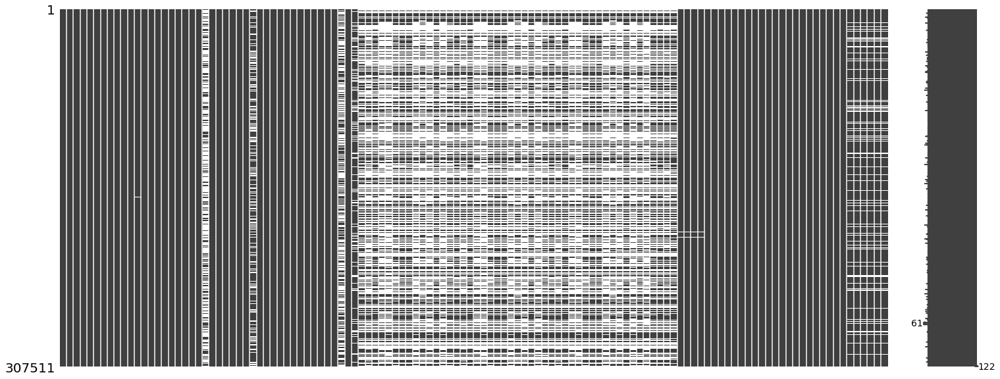

In [9]:
msno.matrix(application_train)

In [10]:
missing_values = (application_train.isnull().mean())*100
missing_values = missing_values.reset_index()
missing_values = missing_values.rename(columns={"index": "Column", 0: "Missing"})
missing_values

,Column,Missing
0,SK_ID_CURR,0.000000
1,TARGET,0.000000
2,NAME_CONTRACT_TYPE,0.000000
3,CODE_GENDER,0.000000
4,FLAG_OWN_CAR,0.000000
...,...,...
117,AMT_REQ_CREDIT_BUREAU_DAY,13.501631
118,AMT_REQ_CREDIT_BUREAU_WEEK,13.501631
119,AMT_REQ_CREDIT_BUREAU_MON,13.501631
120,AMT_REQ_CREDIT_BUREAU_QRT,13.501631


In [11]:
fig = px.histogram(missing_values, x="Missing")
fig.show()

## Remove features where more than 30% rows are missing

In [12]:
left = list(missing_values[missing_values['Missing'] >= 30]['Column'])

application_train.drop(columns=left, inplace=True)

## Merge Flag documents data

In [13]:
c_list = []
for c in application_train.columns:
    if "FLAG_DOCUMENT" in c:
        c_list.append(c)

In [14]:
flags = pd.DataFrame(application_train, columns=c_list)
application_train['FLAG_DOCUMENTS'] = flags.sum(axis=1)
application_train.drop(columns=c_list, inplace=True)
application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_DOCUMENTS
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0,1
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,2.0,0.0,-617.0,NaN,NaN,NaN,NaN,NaN,NaN,1
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0,1


## Imputing missing data

In [15]:
cat = []
for i in range(application_train.shape[1]):
    if application_train.dtypes[i] == 'O':
        cat.append(application_train.columns[i])
cat.append("SK_ID_CURR")

In [16]:
categorical_data = pd.DataFrame(application_train, columns=cat)
categorical_data

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,SK_ID_CURR
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,WEDNESDAY,Business Entity Type 3,100002
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,MONDAY,School,100003
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,MONDAY,Government,100004
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,WEDNESDAY,Business Entity Type 3,100006
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,THURSDAY,Religion,100007
...,...,...,...,...,...,...,...,...,...,...,...,...
307506,Cash loans,M,N,N,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,THURSDAY,Services,456251
307507,Cash loans,F,N,Y,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,MONDAY,XNA,456252
307508,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Separated,House / apartment,THURSDAY,School,456253
307509,Cash loans,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,WEDNESDAY,Business Entity Type 1,456254


In [17]:
most_frequent_imputer = SimpleImputer(strategy='most_frequent')

result_most_frequent_imputer = most_frequent_imputer.fit_transform(categorical_data)

categorical_data = pd.DataFrame(result_most_frequent_imputer, columns=cat)
categorical_data

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,SK_ID_CURR
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,WEDNESDAY,Business Entity Type 3,100002
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,MONDAY,School,100003
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,MONDAY,Government,100004
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,WEDNESDAY,Business Entity Type 3,100006
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,THURSDAY,Religion,100007
...,...,...,...,...,...,...,...,...,...,...,...,...
307506,Cash loans,M,N,N,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,THURSDAY,Services,456251
307507,Cash loans,F,N,Y,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,MONDAY,XNA,456252
307508,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Separated,House / apartment,THURSDAY,School,456253
307509,Cash loans,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,WEDNESDAY,Business Entity Type 1,456254


In [18]:
num = application_train.columns[~application_train.columns.isin(cat[:-1])]

In [19]:
numerical_data = pd.DataFrame(application_train, columns=num)
numerical_data

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_DOCUMENTS
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0,1
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,2.0,0.0,-617.0,NaN,NaN,NaN,NaN,NaN,NaN,1
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327,-236,...,0.0,0.0,-273.0,NaN,NaN,NaN,NaN,NaN,NaN,1
307507,456252,0,0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775,365243,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1
307508,456253,0,0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966,-7921,...,6.0,0.0,-1909.0,1.0,0.0,0.0,1.0,0.0,1.0,1
307509,456254,1,0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961,-4786,...,0.0,0.0,-322.0,0.0,0.0,0.0,0.0,0.0,0.0,1


In [20]:
median_imputer = SimpleImputer(strategy='median')

result_median_imputer = median_imputer.fit_transform(numerical_data)

numerical_data = pd.DataFrame(result_median_imputer, columns=num)
numerical_data

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_DOCUMENTS
0,100002.0,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,...,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
1,100003.0,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,...,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,100004.0,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,...,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006.0,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,...,2.0,0.0,-617.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
4,100007.0,0.0,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932.0,-3038.0,...,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251.0,0.0,0.0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327.0,-236.0,...,0.0,0.0,-273.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
307507,456252.0,0.0,0.0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775.0,365243.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
307508,456253.0,0.0,0.0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966.0,-7921.0,...,6.0,0.0,-1909.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0
307509,456254.0,1.0,0.0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961.0,-4786.0,...,0.0,0.0,-322.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [21]:
application_train = pd.merge(numerical_data, categorical_data, on = "SK_ID_CURR", how = "inner")
application_train

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE
0,100002.0,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,...,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,WEDNESDAY,Business Entity Type 3
1,100003.0,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,...,F,N,N,Family,State servant,Higher education,Married,House / apartment,MONDAY,School
2,100004.0,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,...,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,MONDAY,Government
3,100006.0,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,...,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,WEDNESDAY,Business Entity Type 3
4,100007.0,0.0,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932.0,-3038.0,...,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,THURSDAY,Religion
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251.0,0.0,0.0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327.0,-236.0,...,M,N,N,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,THURSDAY,Services
307507,456252.0,0.0,0.0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775.0,365243.0,...,F,N,Y,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,MONDAY,XNA
307508,456253.0,0.0,0.0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966.0,-7921.0,...,F,N,Y,Unaccompanied,Working,Higher education,Separated,House / apartment,THURSDAY,School
307509,456254.0,1.0,0.0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961.0,-4786.0,...,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,WEDNESDAY,Business Entity Type 1


## Traget distribution in train set

Text(0.5, 1.0, 'Traget distribution in train set')

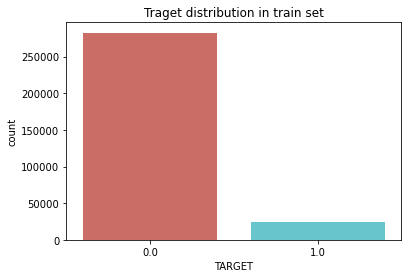

In [22]:
ax = sns.countplot(x='TARGET', data=application_train, palette='hls')
ax.set_title('Traget distribution in train set')

## Define descriptor and target 

In [23]:
X = application_train.loc[:, ~application_train.columns.isin(['SK_ID_CURR', 'TARGET'])]

In [24]:
X = pd.get_dummies(X)

In [25]:
y = application_train["TARGET"]

## Scaling data

In [26]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [27]:
rf_model = RandomForestClassifier(n_jobs = -1, class_weight = 'balanced', max_depth = 4)

## Feature Selection : Boruta

In [ ]:
feat_selector = bp(rf_model, n_estimators='auto', verbose=1, max_iter=50)
feat_selector.fit(X_scaled, y)

Iteration: 1 / 50
Iteration: 2 / 50


In [ ]:
feat_selector.ranking_

In [ ]:
X_boruta = feat_selector.transform(np.array(X))

## Split data into train and validation sets

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_boruta, y, test_size = 0.20, stratify=y)

In [ ]:
X_train = scaler.fit_transform(X_train)
X_val = scaler.fit_transform(X_val)

In [ ]:
scale_pos_weight = y_train[y_train == 0].count()/y_train[y_train == 1].count()

## Handling imbalanced data with undersampling : NearMiss

In [ ]:
nm = NearMiss()
X_train_nm, y_train_nm = nm.fit_resample(X_train, y_train)

In [ ]:
model = xg.XGBClassifier(scale_pos_weight=scale_pos_weight)

model.fit(X_train_nm, y_train_nm)

In [ ]:
y_pred = model.predict(X_val)

In [ ]:
accuracy_score(y_val, y_pred)

In [ ]:
ax=sns.heatmap(confusion_matrix(y_val, y_pred), annot=True, fmt='.4g', cmap='Reds')
ax.set_title('Confusion matrix boruta + NearMiss + Xgboost')

In [ ]:
print("Classification report boruta + NearMiss + Xgboost \n")
print(classification_report(y_val, y_pred))

-----------------------------------------------------------------

In [ ]:
model2 = xg.XGBClassifier(scale_pos_weight=scale_pos_weight)

model2.fit(X_train, y_train)

In [ ]:
y_pred2 = model2.predict(X_val)

In [ ]:
accuracy_score(y_val, y_pred2)

In [ ]:
ax=sns.heatmap(confusion_matrix(y_val, y_pred2), annot=True, fmt='.4g', cmap='Reds')
ax.set_title('Confusion matrix boruta + Xgboost')

In [ ]:
print('Classification report boruta + Xgboost \n')
print(classification_report(y_val, y_pred2))

--------------------------------------------------------------------------------

## Recursive Feature Elimination

In [ ]:
selector = RFE(rf_model, step=1, verbose=1)
selector.fit(X_scaled, y)

In [ ]:
print(selector.n_features_)

In [ ]:
X_rfe = selector.transform(X_scaled)

## Split data into train and test

In [ ]:
X_train_rfe, X_val_rfe, y_train_rfe, y_val_rfe = train_test_split(X_rfe, y, test_size = 0.25, stratify=y)

In [ ]:
X_train_rfe = scaler.fit_transform(X_train_rfe)
X_val_rfe = scaler.fit_transform(X_val_rfe)

In [ ]:
scale_pos_weight = y_train_rfe[y_train_rfe == 0].count()/y_train_rfe[y_train_rfe == 1].count()

## Model training

In [ ]:
model3 = xg.XGBClassifier(scale_pos_weight=scale_pos_weight)

model3.fit(X_train_rfe, y_train_rfe)

In [ ]:
y_pred3 = model3.predict(X_val_rfe)

In [ ]:
accuracy_score(y_val_rfe, y_pred3)

In [ ]:
ax = sns.heatmap(confusion_matrix(y_val_rfe, y_pred3), annot=True, fmt='.4g', cmap='Reds')
ax.set_title('Confusion matrix RFE + Xgboost')

In [ ]:
print('Classification report RFE + Xgboost \n')
print(classification_report(y_val_rfe, y_pred3))

--------------------------

## AutoML : LazyPredict

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.25)